In [1]:
import pandas as pd
import numpy as np
import plotly.graph_objs as go
import matplotlib.pyplot as plt
np.set_printoptions(precision=2, linewidth=150)

In [2]:
flag_totals = False # print summary statistics for groups of numbers
flag_elements = False # print groups of nnumbers
with open("../data/xyie_data/1K0Slice_Integratedpm0p1.xyie") as fd: 
    count = 0 
    for line in fd: 
        if len(line) > 30: 
            line_elements = line.strip().split()
            if flag_totals:
                print("Element Count:", len(line_elements)) 
            if flag_elements:
                elements = np.array(line_elements, dtype=np.float128)
                elements = np.hstack([elements, [0,0]]).reshape((6,10))
                print(elements,end="\n\n")
            count += 1; 
    if flag_totals:
        print("total:",count) 

In [3]:
df = pd.read_csv("../data/Data_From_1K0Slice_Integratedpm0p1.csv",names=["x","y","z"])
df.shape

(36461, 3)

In [4]:
df.head()

,x,y,z
0,-1.7929,0.002324,10.0610
1,-1.7851,0.002324,10.3220
2,-1.7748,0.002324,9.8859
3,-1.7652,0.002324,9.6727
4,-1.7552,0.002324,9.5339


In [5]:
df.tail()

,x,y,z
36456,1.7640,0.99742,0.0
36457,1.7738,0.99742,0.0
36458,1.7837,0.99742,0.0
36459,1.7932,0.99742,0.0
36460,1.8024,0.99742,0.0


In [6]:
print("unique z: ",df.z.unique().size)
print("unique x: ",df.x.unique().size)
print("unique y: ",df.y.unique().size)

unique z:  26894
unique x:  361
unique y:  101


### Data Cross Sections

In [7]:
y_sorted = sorted(df.y.unique())

In [8]:
y_sorted[0],y_sorted[1]

(0.0023244, 0.010074)

* plots smallest y-values

In [9]:

#for i in range(21):
#    plt.plot(df.z[df.y == y_sorted[i]]);
#    plt.title(f"Smallest Y Value: {i+1}")
#    plt.show()

* y-data

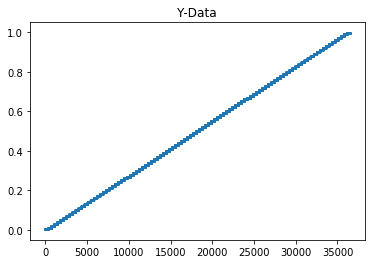

In [10]:
%matplotlib inline
plt.scatter(range(len(df.y)), df.y, s=1, marker='o');
plt.title("Y-Data");

* x vs. y data

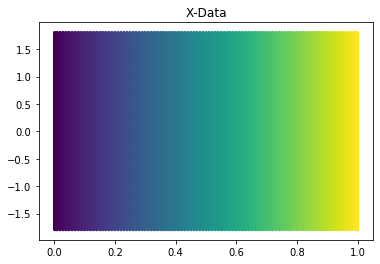

In [11]:
%matplotlib inline
plt.scatter(df.y,
            df.x, 
            s=5,
            c=np.arange(len(df.x)) // len(df.x.unique()), 
            marker='o');
plt.title("X-Data");

* z-data

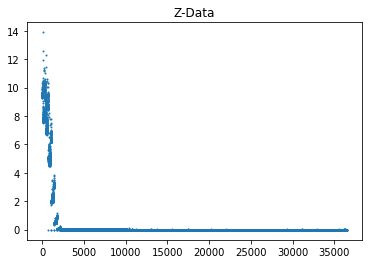

In [12]:
plt.scatter(range(len(df.z)), df.z,s=1)
plt.title("Z-Data");

# Plots

#### Scatter

In [13]:
x_unique = df.x.unique()
y_unique = df.y.unique()

In [14]:
data = [go.Scatter3d(x=df.x, y=df.y, z=df.z,
                     mode="markers",
                     marker = dict(
                         color = '#FFBAD2',
                         line = dict(width = 0.01)
                     )
                    )]

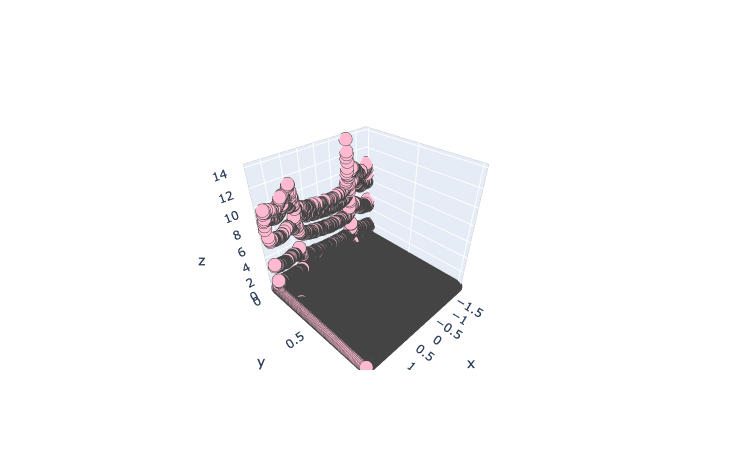

In [15]:
fig = go.Figure(data)
fig.show()

### Heat Map

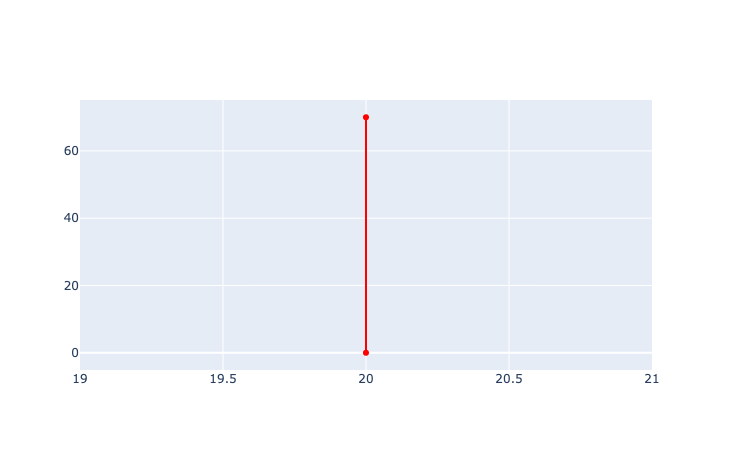

In [16]:
trace = go.Scatter(x=[20,20],y=[0,70], marker={"color":"red"})
data = [trace]
line_fig = go.Figure(data)
line_fig.show()

In [17]:
# set the background
#df.z[df.z == -1] = -5

In [18]:
#df.z[df.z = 0] = -0.2

In [19]:
df.z.max()

13.897

* Creating a New Z value to test things out

In [20]:
new_z = df.z.copy()

* removing data below the v-shapes

In [21]:
#new_df = df[df.y > (sorted(df.y.unique())[5])]

* constraining the colormap

In [22]:
# adding a minimum value
new_z.loc[new_z < 0] = 0

# adding a maximum value (0.057 tends to work (eliminates 3-actual values))
# - here I am going to put a much smaller thresold value
max_val = 0.025
new_z.loc[new_z > max_val] = max_val

In [23]:
new_z.sort_values(ascending=False).head(20)

0       0.025
1686    0.025
1678    0.025
1679    0.025
1680    0.025
1681    0.025
1682    0.025
1683    0.025
1684    0.025
1685    0.025
1687    0.025
1697    0.025
1688    0.025
1689    0.025
1690    0.025
1691    0.025
1692    0.025
1693    0.025
1694    0.025
1695    0.025
Name: z, dtype: float64

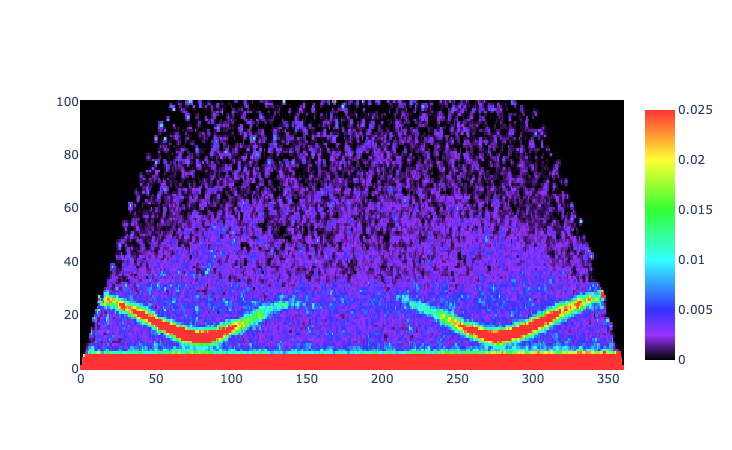

In [24]:
heat_trace = go.Heatmap(
    z=np.array(new_z).reshape(-1, (len(df.x.unique()))),

    colorscale= [
        
        [0, 'rgb(0, 0, 0)'], # black
                 
        [0.1, 'rgb(153, 51, 255)'], # purple

        [0.2, 'rgb(51, 51, 255)'],  # blue
                 
        [0.3, 'rgb(51, 153, 255)'], # light blue
                 
        [0.4, 'rgb(51, 255, 255)'], # teal

        [0.5, 'rgb(51, 255, 153)'], # light green

        [0.6, 'rgb(51, 255, 51)'],  # green

        [0.7, 'rgb(153, 255, 51)'], # yellow green

        [0.8, 'rgb(255, 255, 51)'], # yellow
                 
        [0.9, 'rgb(255, 153, 51)'], # orange
                 
        [1, 'rgb(255, 51, 51)']
    ]
)

line_trace = go.Scatter(x=[20,20],y=[0,len(df.y.unique())-1], marker={"color":"red"})
#data=[heat_trace,line_trace]
data=[heat_trace]
heat_fig = go.Figure(data)
heat_fig.show()

In [25]:
df.loc[df.z < 0]

,x,y,z
3965,1.754100,0.099971,-0.000644
4325,1.744200,0.110050,-0.002159
4326,1.754100,0.110050,-0.001440
4687,1.754100,0.120120,-0.000874
7561,1.614300,0.199950,-0.000770
11944,-1.485600,0.330150,-0.000013
12671,-1.435600,0.350300,-0.000056
13178,0.024384,0.359600,-0.000560
13242,0.664390,0.359600,-0.000523
13538,0.014379,0.369670,-0.000673


In [26]:
df.z.max()

13.897

In [27]:
df.loc[df.z>0.06].z = 0

/Users/jamesshaddix/anaconda3/envs/data-sci/lib/python3.7/site-packages/pandas/core/generic.py:5209: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



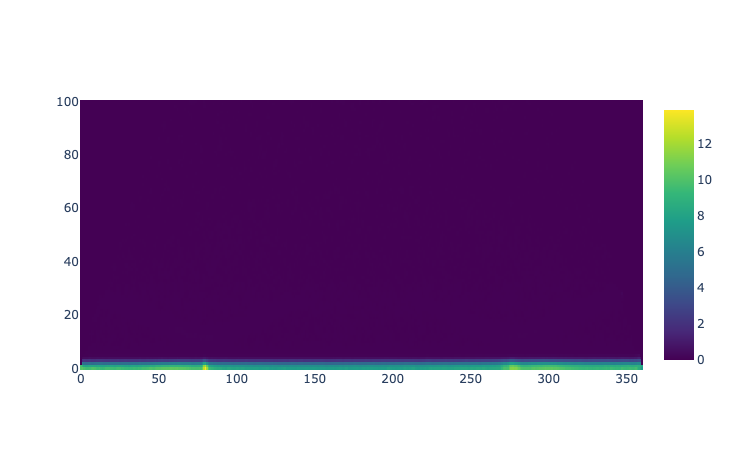

In [28]:
heat_trace = go.Heatmap(
    z=np.array(df.z).reshape(-1, (len(df.x.unique()))),
    colorscale='Viridis',
    #showscale=False
)
data=[heat_trace]
#py.iplot(go.Figure(data,layout=go.Layout(paper_bgcolor="#5B5B5B")))
new_fig = go.Figure(data)
new_fig.show()

### Surface Plot

In [29]:
x_unique = df.x.unique()
y_unique = df.y.unique()
len(x_unique), len(y_unique)

(361, 101)

In [30]:
(len(x_unique)-1)//10

36

In [31]:
np.cumsum(np.full((1, (len(x_unique)-1)//10), 10))

array([ 10,  20,  30,  40,  50,  60,  70,  80,  90, 100, 110, 120, 130, 140, 150, 160, 170, 180, 190, 200, 210, 220, 230, 240, 250, 260, 270, 280,
       290, 300, 310, 320, 330, 340, 350, 360])

In [32]:
X, Y = np.meshgrid(x_unique,y_unique)
X.shape, Y.shape

((101, 361), (101, 361))

In [33]:
Z = np.array(df.z).reshape((len(y_unique), len(x_unique)))

In [34]:
data = [go.Surface(x=X, y=Y, z=Z)]

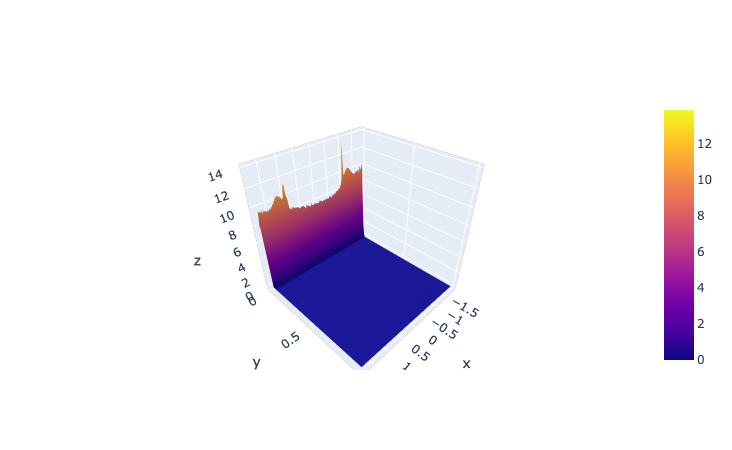

In [35]:
surface_fig = go.Figure(data)
surface_fig.show()